# Dog Breed Identification
It's a Kaggle competition which has 120 breeds of dog images. The task is to classify the dog images.
Competition link: https://www.kaggle.com/c/dog-breed-identification

What this notebook will cover
 - Get the data ready
 - Preprocessing
 - Augmentation
 - Using Transfer learning to train a model
 - Evaluate The model
 - Tune hyper-parameter accordingly
 - Make submission file

## Getting the workspace ready

In [72]:
import tensorflow as tf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import Image
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Dense, Flatten, Dropout, BatchNormalization, Add, GlobalAveragePooling2D, ReLU, LeakyReLU,Activation
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from tensorflow.keras import layers

# Getting The Data Ready

In [2]:
df = pd.read_csv('../dataset/dog-breed-identification/labels.csv')
df.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: xlabel='breed'>

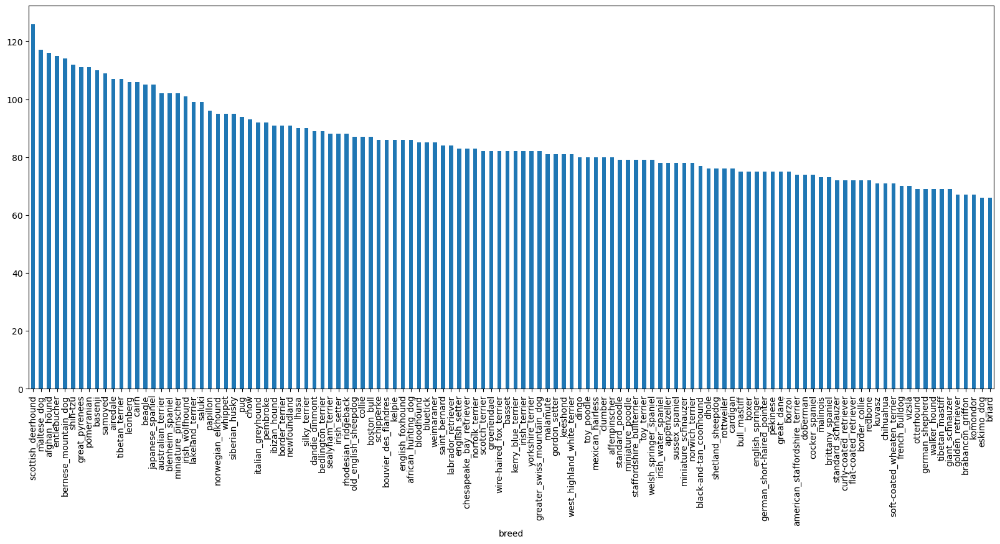

In [3]:
plt.figure(figsize=(20,8))
df['breed'].value_counts().plot.bar()

### Getting Images and theri labels
Creating a list of filenames in the image directory

In [4]:
filepath = ['../dataset/dog-breed-identification/train/'+ fname+'.jpg' for fname in df['id']]

In [5]:
filepath[:10]

['../dataset/dog-breed-identification/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '../dataset/dog-breed-identification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '../dataset/dog-breed-identification/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '../dataset/dog-breed-identification/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '../dataset/dog-breed-identification/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '../dataset/dog-breed-identification/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '../dataset/dog-breed-identification/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '../dataset/dog-breed-identification/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '../dataset/dog-breed-identification/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '../dataset/dog-breed-identification/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

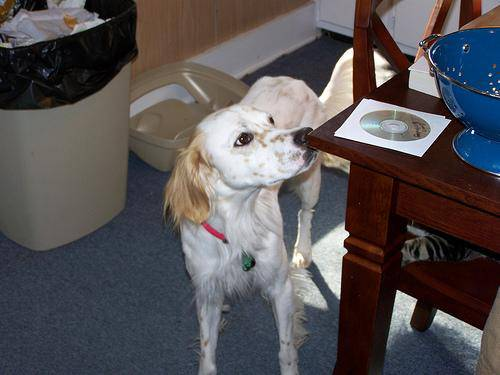

In [6]:
Image(filepath[3050])

In [7]:
# Checking the filepath length and the number of files in the directory
import os
len(os.listdir('../dataset/dog-breed-identification/train')),len(filepath)

(10222, 10222)

In [8]:
labels = np.array(df['breed'])

In [9]:
labels[:10]

array(['boston_bull', 'dingo', 'pekinese', 'bluetick', 'golden_retriever',
       'bedlington_terrier', 'bedlington_terrier', 'borzoi', 'basenji',
       'scottish_deerhound'], dtype=object)

In [10]:
unique_breeds = np.unique(labels)
len(unique_breeds)
unique_breeds[:10]

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle'], dtype=object)

### One hot encodding the labels

In [11]:
y = np.array([label == unique_breeds for label in labels]).astype(int)
y[:2]


array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0]])

In [12]:
unique_breeds[(y[0]).argmax()]

'boston_bull'

In [13]:
X = filepath

## Creating a validation Set

In [14]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=  0.08)
len(X_train), len(y_train), len(X_test),len(y_test)

(9404, 9404, 818, 818)

# Preprocessing The images
Will create functions to do the preprocessigng

In [15]:
from tensorflow.keras import layers
 # For advanced augmentations like rotation and shear
import tensorflow_addons as tfa


def augment_image(image, label):
    # Random horizontal flip
    image = tf.image.random_flip_left_right(image)

    # Random vertical flip
    image = tf.image.random_flip_up_down(image)

    # Random brightness adjustment
    image = tf.image.random_brightness(image, max_delta=0.2)

    # Random contrast adjustment
    image = tf.image.random_contrast(image, lower=0.8, upper=1.2)

    # Random rotation (90-degree increments)
    random_angle = tf.random.uniform([], minval=0, maxval=4, dtype=tf.int32)  # 0, 1, 2, or 3
    image = tf.image.rot90(image, k=random_angle)

    return image, label
    

# Modify create_data_batches to use augment_image


C:\Users\ict\anaconda3\envs\mypy\lib\site-packages\tensorflow_addons\utils\tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(
C:\Users\ict\anaconda3\envs\mypy\lib\site-packages\tensorflow_addons\utils\ensure_tf_install.py:53: UserWarning: Tensorflow Addons supports using Python ops for all Tensorflow versions above or equal to 2.12.0 and strictly below 2.15.0 (nightly versions are not supported). 
 The versions of TensorFlow you are currently using is 2.10.0 and is not supported. 
Some things might work, some things might not.
If you were to encounter a bug, do not file an issue.
If you want

In [16]:
def processing_image(path):
    image = tf.io.read_file(path)
    image = tf.image.decode_jpeg(image,channels=3)
    image = tf.image.convert_image_dtype(image, tf.float32)
    image = tf.image.resize(image, size=(224,224))
    return image

In [17]:
def getting_labels(images,labels):
    return processing_image(images),labels

In [28]:
def create_data_batches(x,y=None, batch_size = 16, valid_data = False, test_data = False):
    if test_data:
        print('Creating Test Data Batches.......')
        data = tf.data.Dataset.from_tensor_slices((tf.constant(x)))
        data = data.map(processing_image).batch(batch_size)
        return data
    elif valid_data:
        print('Creating Validation Data Batches.....')
        data = tf.data.Dataset.from_tensor_slices((tf.constant(x),tf.constant(y)))
        data = data.map(getting_labels).batch(batch_size)
        return data
    else:
        print('Creating Trainging Data Batches......')
        data = tf.data.Dataset.from_tensor_slices((tf.constant(x),tf.constant(y)))
        data = data.shuffle(buffer_size=len(x))
        data = data.map(getting_labels)
        #data = data.map(augment_image, num_parallel_calls=tf.data.AUTOTUNE)
        data = data.batch(batch_size)
        return data

In [29]:
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_test, y_test, valid_data=True)

Creating Trainging Data Batches......
Creating Validation Data Batches.....


In [32]:
def view_images(images,labels):
    plt.figure(figsize=(10,10))
    for i in range(16):
        plt.subplot(4,4,i+1)
        plt.imshow(images[i])
        plt.title(unique_breeds[np.argmax(labels[i])])
        plt.axis('off')
    plt.show()

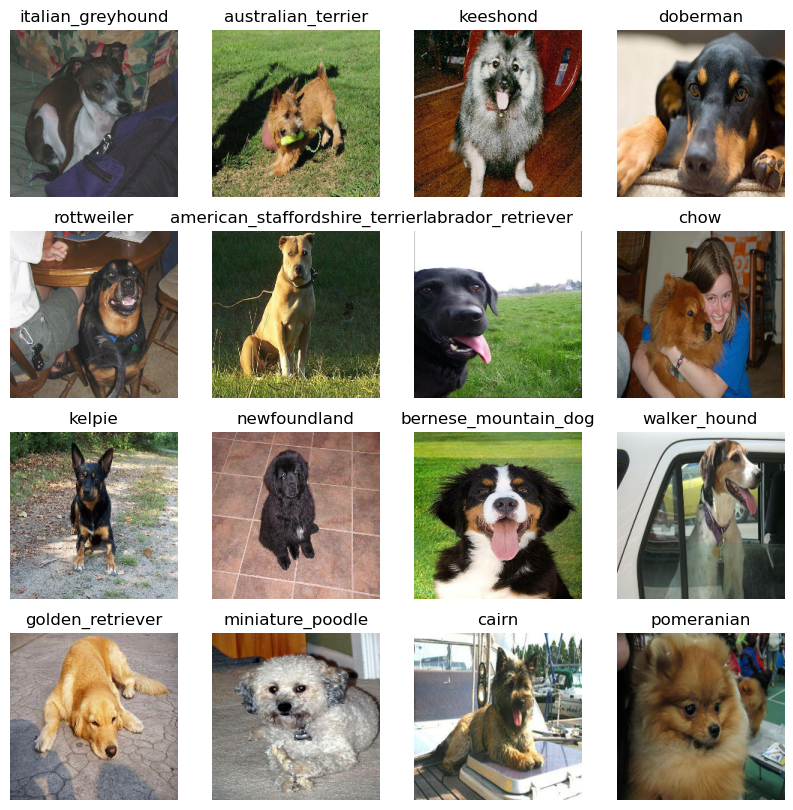

In [33]:
images , labels = next(train_data.as_numpy_iterator())
view_images(images,labels)

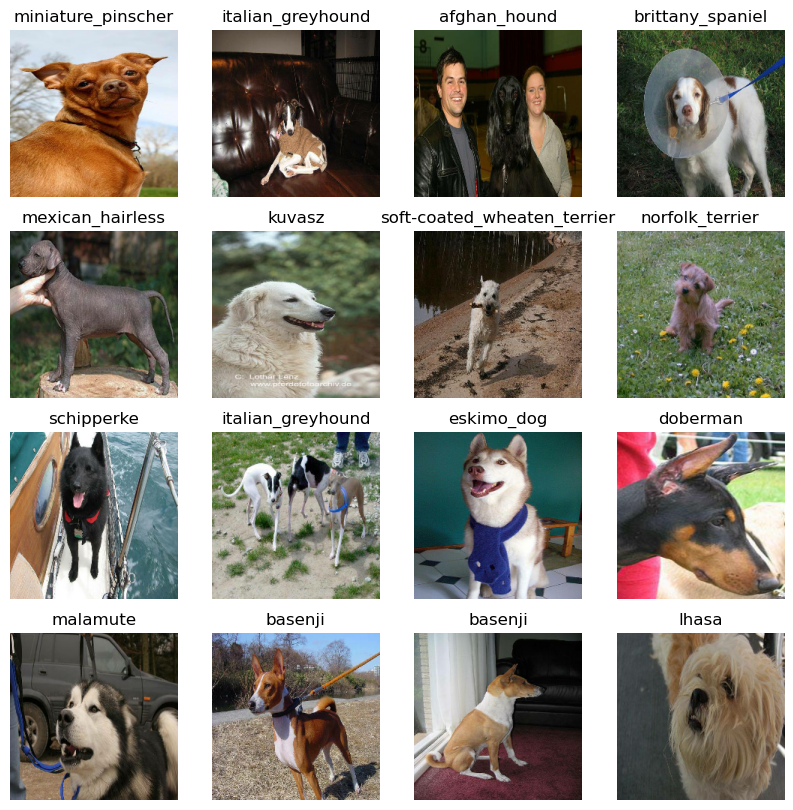

In [34]:
images, labels = next(val_data.as_numpy_iterator())
view_images(images,labels)

# DensNet201


In [40]:
from tensorflow.keras.applications.densenet import DenseNet201
base_model = DenseNet201(weights = 'imagenet', include_top = False, input_shape = (224,224,3))

for layer in base_model.layers[:]:
   
    layer.trainable = False
base_model.summary()

Model: "densenet201"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 zero_padding2d (ZeroPadding2D)  (None, 230, 230, 3)  0          ['input_1[0][0]']                
                                                                                                  
 conv1/conv (Conv2D)            (None, 112, 112, 64  9408        ['zero_padding2d[0][0]']         
                                )                                                                 
                                                                                        

In [50]:
model = tf.keras.models.Sequential([
    layers.Input(shape=(224,224,3)),
    base_model,
    GlobalAveragePooling2D(),
    Dense(512),
    BatchNormalization(),
    Activation('relu'),
    Dropout(0.6),
    
    Dense(120,activation='softmax')
])
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 densenet201 (Functional)    (None, 7, 7, 1920)        18321984  
                                                                 
 global_average_pooling2d (G  (None, 1920)             0         
 lobalAveragePooling2D)                                          
                                                                 
 dense_3 (Dense)             (None, 512)               983552    
                                                                 
 batch_normalization_2 (Batc  (None, 512)              2048      
 hNormalization)                                                 
                                                                 
 activation_1 (Activation)   (None, 512)               0         
                                                                 
 dropout_1 (Dropout)         (None, 512)              

In [51]:
from tensorflow.keras.optimizers import Adam
optimizer = Adam(learning_rate = 0.0001,beta_1=0.98)
model.compile(loss='categorical_crossentropy',
               optimizer=optimizer,
               metrics=['accuracy']
              )

In [48]:
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

early_stopping_callback = EarlyStopping(
    monitor='val_loss',  
    patience=5,          
    restore_best_weights=True  
)
lr_reduce = ReduceLROnPlateau(
    monitor= 'val_loss',
    factor = 0.5,
    patience = 1,
    min_lr = 1e-6
)

In [52]:
Epochs =50
history = model.fit(train_data, epochs=Epochs, validation_data=val_data, verbose=2,callbacks=[early_stopping_callback,lr_reduce])
model.save('../models/dog_breed_dense.h5')

Epoch 1/50
588/588 - 70s - loss: 3.9077 - accuracy: 0.1697 - val_loss: 1.9762 - val_accuracy: 0.5941 - lr: 1.0000e-04 - 70s/epoch - 119ms/step
Epoch 2/50
588/588 - 53s - loss: 2.1020 - accuracy: 0.4858 - val_loss: 1.2152 - val_accuracy: 0.7311 - lr: 1.0000e-04 - 53s/epoch - 89ms/step
Epoch 3/50
588/588 - 53s - loss: 1.5234 - accuracy: 0.6146 - val_loss: 0.9466 - val_accuracy: 0.7665 - lr: 1.0000e-04 - 53s/epoch - 90ms/step
Epoch 4/50
588/588 - 53s - loss: 1.2226 - accuracy: 0.6848 - val_loss: 0.8162 - val_accuracy: 0.7995 - lr: 1.0000e-04 - 53s/epoch - 90ms/step
Epoch 5/50
588/588 - 53s - loss: 1.0324 - accuracy: 0.7275 - val_loss: 0.7425 - val_accuracy: 0.8093 - lr: 1.0000e-04 - 53s/epoch - 90ms/step
Epoch 6/50
588/588 - 53s - loss: 0.9059 - accuracy: 0.7581 - val_loss: 0.6873 - val_accuracy: 0.8191 - lr: 1.0000e-04 - 53s/epoch - 89ms/step
Epoch 7/50
588/588 - 53s - loss: 0.8080 - accuracy: 0.7780 - val_loss: 0.6614 - val_accuracy: 0.8142 - lr: 1.0000e-04 - 53s/epoch - 90ms/step
Epoch

In [70]:
def plot_learning_curves(history):
    plt.figure(figsize=(12,5))
    plt.subplot(1,2,1)
    plt.plot(history.history['accuracy'], label = 'Training Accuracy')
    plt.plot(history.history['val_accuracy'], label = 'Validation Accuracy', linestyle='--')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.subplot(1,2,2)
    plt.plot(history.history['loss'], label = 'Training Loss')
    plt.plot(history.history['val_loss'], label = 'Validation Loss', linestyle='--')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

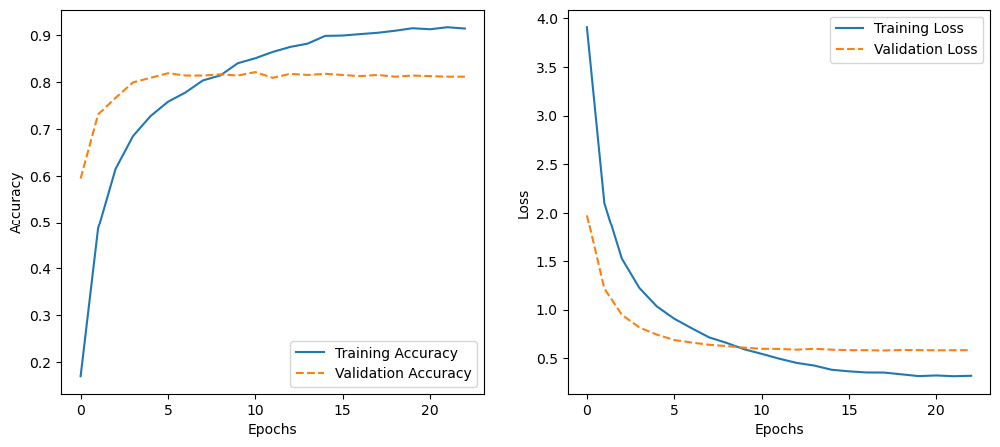

In [71]:
plot_learning_curves(history)

## Making predictions

In [57]:
predictions = model.predict(val_data)
predictions[0]

52/52 [==============================] - 7s 80ms/step


array([7.10453196e-06, 3.98965403e-06, 8.48846776e-06, 2.65134178e-04,
       7.16197756e-05, 3.33188036e-05, 1.02510108e-04, 1.57055922e-03,
       1.91219169e-06, 2.13922303e-05, 1.22735864e-05, 2.23321308e-06,
       2.90420485e-06, 7.39743191e-05, 1.57592967e-05, 8.54736936e-06,
       1.92841708e-06, 2.88277097e-05, 1.29032446e-06, 1.21021760e-04,
       1.56166298e-05, 1.10515080e-04, 8.28161184e-03, 4.02274782e-06,
       1.70015719e-05, 6.68945067e-05, 4.23983874e-06, 2.97283509e-06,
       4.18137934e-05, 1.05533563e-02, 3.60727718e-05, 8.06683204e-07,
       2.28289682e-05, 4.19621574e-05, 1.62935521e-06, 2.07010157e-06,
       2.37415406e-05, 1.95896282e-04, 1.06549589e-03, 1.76142985e-05,
       2.32028174e-06, 8.65874881e-07, 2.11427604e-07, 4.18200543e-05,
       1.28381646e-06, 1.88856011e-05, 2.55588693e-05, 2.98215873e-05,
       6.40371468e-07, 7.76552479e-05, 7.93638465e-05, 1.74102315e-05,
       3.80037454e-06, 2.76843298e-06, 9.70841938e-06, 1.98853362e-04,
      

In [58]:
unique_breeds[np.argmax(predictions[0])]

'miniature_pinscher'

In [59]:
def get_labels(predictions):
    # Apply argmax across each row if predictions have shape (batch_size, 120)
    pred_indices = np.argmax(predictions,axis=1)
    return [unique_breeds[idx] for idx in pred_indices]

In [60]:
def get_data_from_batch(data):
    images = []
    labels = []
    for img_batch, label_batch in data.unbatch().as_numpy_iterator():
        images.append(img_batch)
        labels.append(unique_breeds[np.argmax(label_batch)])
    return images, labels

In [61]:
def plot_predictons(images, prediction, labels, x):
    pred_labels = get_labels(prediction)  # Assuming get_labels returns predicted class labels
    plt.figure(figsize=(20, 20))
    for i in range(36):
        plt.subplot(6, 6, i+1)
        plt.imshow(images[x])

       
        # Map predicted class index to its name in unique_breeds
        pred_class_name = pred_labels[x]  # Use pred_class directly as index
        true_class_name = labels[x]  # Use true_class directly as index

        # Compare predicted class to true class
        if pred_labels[x] == labels[x]:
            color = 'green'
        else:
            color = 'red'

        # Title with predicted and true class names
        x = x+1
        plt.title(f"Pred: {pred_class_name}\nTrue: {true_class_name}", color=color)
        plt.axis('off')
    plt.tight_layout()
    plt.show()

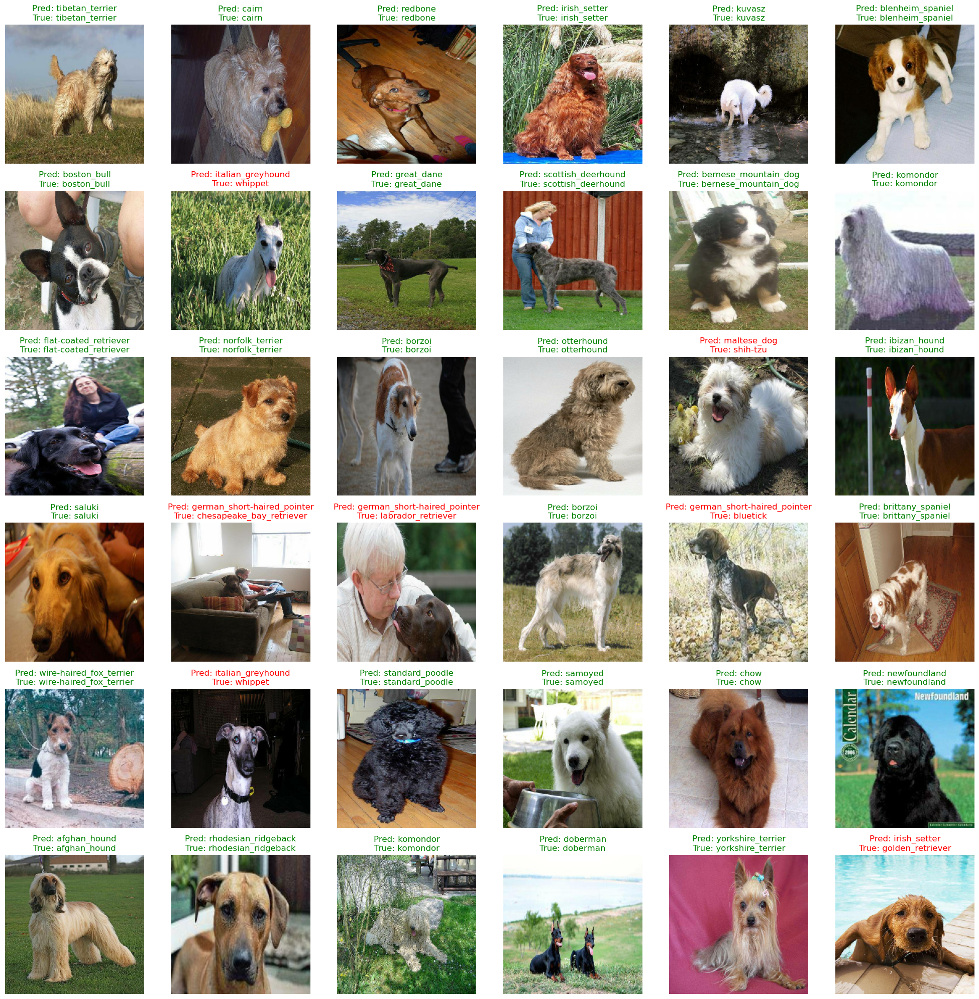

In [63]:
val_images, val_labels = get_data_from_batch(val_data)
plot_predictons(val_images,predictions,val_labels,x=500)

# Making Prediction on the test dataset and making submission file

In [75]:
test_path = '../dataset/dog-breed-identification/test/'
test_filenames = [test_path + fname for fname in os.listdir(test_path)]

test_filenames[:5]

['../dataset/dog-breed-identification/test/000621fb3cbb32d8935728e48679680e.jpg',
 '../dataset/dog-breed-identification/test/00102ee9d8eb90812350685311fe5890.jpg',
 '../dataset/dog-breed-identification/test/0012a730dfa437f5f3613fb75efcd4ce.jpg',
 '../dataset/dog-breed-identification/test/001510bc8570bbeee98c8d80c8a95ec1.jpg',
 '../dataset/dog-breed-identification/test/001a5f3114548acdefa3d4da05474c2e.jpg']

In [76]:
len(test_filenames)

10357

In [77]:
test_data = create_data_batches(test_filenames, test_data=True)

Creating Test Data Batches.......


In [78]:
test_prediction = model.predict(test_data)

648/648 [==============================] - 56s 82ms/step


In [84]:
submission_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
submission_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [85]:
test_path = '../dataset/dog-breed-identification/test/'
submission_df["id"] = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
submission_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,000621fb3cbb32d8935728e48679680e,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,00102ee9d8eb90812350685311fe5890,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0012a730dfa437f5f3613fb75efcd4ce,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,001510bc8570bbeee98c8d80c8a95ec1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,001a5f3114548acdefa3d4da05474c2e,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [86]:
submission_df[list(unique_breeds)] = test_prediction
submission_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,000621fb3cbb32d8935728e48679680e,2.774862e-06,0.000004,1.110401e-07,4.126079e-08,1.683487e-06,6.265061e-06,7.390784e-09,3.706952e-06,1.275446e-07,...,1.095788e-06,1.837673e-06,2.218813e-07,7.433741e-07,9.987480e-08,8.387265e-08,2.850750e-08,0.000002,1.362728e-07,4.574252e-07
1,00102ee9d8eb90812350685311fe5890,1.185303e-05,0.000003,5.362210e-06,6.955316e-06,6.220742e-06,2.400541e-04,6.461537e-06,6.628086e-06,6.388061e-06,...,4.558513e-05,2.447568e-05,1.311540e-05,1.978288e-05,9.025499e-06,2.901405e-05,2.436021e-05,0.000013,2.443816e-05,5.640789e-06
2,0012a730dfa437f5f3613fb75efcd4ce,5.269671e-07,0.000216,1.461333e-06,2.234759e-06,2.945976e-07,8.404439e-07,1.934463e-07,5.059222e-07,5.150383e-07,...,1.716997e-07,2.705629e-07,1.250180e-06,2.461347e-05,2.606842e-06,1.870999e-04,8.315972e-07,0.000012,3.788060e-06,2.439101e-06
3,001510bc8570bbeee98c8d80c8a95ec1,2.672260e-02,0.000052,3.707165e-03,1.574122e-03,9.054651e-03,2.361565e-03,7.529982e-04,3.785301e-02,9.429171e-04,...,5.305003e-03,6.888335e-04,9.257961e-03,5.297451e-04,4.937553e-02,2.075588e-03,2.828113e-04,0.014637,3.978134e-04,1.268695e-02
4,001a5f3114548acdefa3d4da05474c2e,5.510112e-03,0.000012,1.335417e-06,6.604068e-07,7.587398e-06,3.867039e-06,4.113992e-06,6.518690e-06,1.225991e-04,...,1.708417e-04,1.903187e-05,1.475581e-05,5.037618e-06,4.347870e-06,2.116378e-05,5.666878e-05,0.000010,2.950324e-05,3.860946e-05


In [88]:
submission_df.to_csv('../dataset/dog-breed-identification/submission_file.csv', index=False)